In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import pandas as pd
from numpy.random import multivariate_normal as mvnorm
from numpy.linalg import norm

import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['axes.facecolor'] = 'white'
%matplotlib inline

import pdb, time

seed = 0
np.random.seed(seed)

### Import and generate data

In [2]:
# Standardised Fama French 5 to industry portfolio 30
# Import data
data = pd.read_pickle("/Users/sky/Downloads/ff5_30_standard_4000_draws.pkl")

In [3]:
# Restrict to 100 time points
X = data[10:410].transpose(2, 1, 0)
# X = data[100:].transpose(2, 1, 0)
X_cov = np.einsum('ijkl,jmkl->imkl', np.expand_dims(X, 1), np.expand_dims(X, 0))

### Train

In [4]:
n_dimensions, _, n_samples, time_steps = X_cov.shape
emp_inv = []
for i in range(time_steps):
    emp_inv.append(np.linalg.inv(np.mean(X_cov[:, :, :, i], 2)))
emp_inv = np.array(emp_inv)

In [5]:
from regain.covariance import GradientEqualTimeGraphicalLasso, TimeGraphicalLasso
tic = time.perf_counter()
tgl_g = GradientEqualTimeGraphicalLasso(max_iter=10, loss='LL', c_level=0.2, theta=0.5, rho=1e2, mult=1.1, weights=[None], m=50, eps=2, psi="laplacian")
emp_inv_score_g, baseline_score_g, fit_score_g, pre_g = tgl_g.fit_cov(X_cov).eval_cov_pre() 
toc = time.perf_counter()
print('Running Time :{}'.format(toc - tic))
# min_pre_tp = np.amin(np.abs(pre_tp[pre_tp != 0]))

/Users/sky/.pyenv/versions/3.7.4/lib/python3.7/site-packages/scipy/optimize/optimize.py:2215: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)


0
0.004013176637996996 -3.559169552700571
120014.56908537073


/Users/sky/.pyenv/versions/3.7.4/lib/python3.7/site-packages/scipy/optimize/optimize.py:2621: RuntimeWarning: invalid value encountered in double_scalars
  w = xb - ((xb - xc) * tmp2 - (xb - xa) * tmp1) / denom
/Users/sky/.pyenv/versions/3.7.4/lib/python3.7/site-packages/scipy/optimize/optimize.py:2216: RuntimeWarning: invalid value encountered in double_scalars
  p = (x - v) * tmp2 - (x - w) * tmp1


9 112272.3744477717
0.031712492436907484 0.2785506854983194
266.0996818417977 0.10490927206369705
Running Time :103.63735364700001


/Users/sky/Downloads/Booth/post_sum/regain/regain/covariance/gradient_equal_time_graphical_lasso.py:466: UserWarning: Objective did not converge.
  warnings.warn("Objective did not converge.")


In [12]:
tgl_score = {}
tgl_pre = {}
for i in np.arange(0, .3, 0.05):
    for j in np.arange(0, .3, 0.05):
        tgl_temp = np.load("/Users/sky/Downloads/Booth/results/tgl_alpha_{}_beta_{}_max_iter_20000.npy".format(str(i), str(j)))
        tgl_pre[i, j] = np.array([k * (np.abs(k) >= 1e-4) for k in tgl_temp])
        tgl_g.precision_ = tgl_pre[i, j]
        _, _, tgl_score[i, j], _ = tgl_g.eval_cov_pre() 
        print(i, j, np.sum(tgl_score[i, j]))
        
        tgl_temp = np.load("/Users/sky/Downloads/Booth/results/tgl_alpha_{}_beta_{}_max_iter_20000.npy".format(str(j), str(i)))
        tgl_pre[j, i] = np.array([k * (np.abs(k) >= 1e-4) for k in tgl_temp])
        tgl_g.precision_ = tgl_pre[j, i]
        _, _, tgl_score[j, i], _ = tgl_g.eval_cov_pre() 
        print(j, i, np.sum(tgl_score[j, i]))

0.0 0.0 -4603.94004864805
0.0 0.0 -4603.94004864805
0.0 0.05 -4697.537900452129
0.05 0.0 -3248.874819886731
0.0 0.1 -4663.339500893733
0.1 0.0 -2268.8856013469676
0.0 0.15000000000000002 -4639.242229523692
0.15000000000000002 0.0 -1229.567653746271
0.0 0.2 -4620.013309859804
0.2 0.0 -261.7494478253127
0.0 0.25 -4603.94004864805
0.25 0.0 551.0388919146246
0.05 0.0 -3248.874819886731
0.0 0.05 -4697.537900452129
0.05 0.05 -3170.0851838501103
0.05 0.05 -3170.0851838501103
0.05 0.1 -3204.012906093168
0.1 0.05 -2289.5974624195605
0.05 0.15000000000000002 -3190.765704900825
0.15000000000000002 0.05 -1287.7864399971932
0.05 0.2 -3179.6657548504627
0.2 0.05 -317.2352959324977
0.05 0.25 -3170.0851838501103
0.25 0.05 504.0609672537006
0.1 0.0 -2268.8856013469676
0.0 0.1 -4663.339500893733
0.1 0.05 -2289.5974624195605
0.05 0.1 -3204.012906093168
0.1 0.1 -2291.159758780243
0.1 0.1 -2291.159758780243
0.1 0.15000000000000002 -2293.7072653769815
0.15000000000000002 0.1 -1311.7262175966275
0.1 0.2 -229

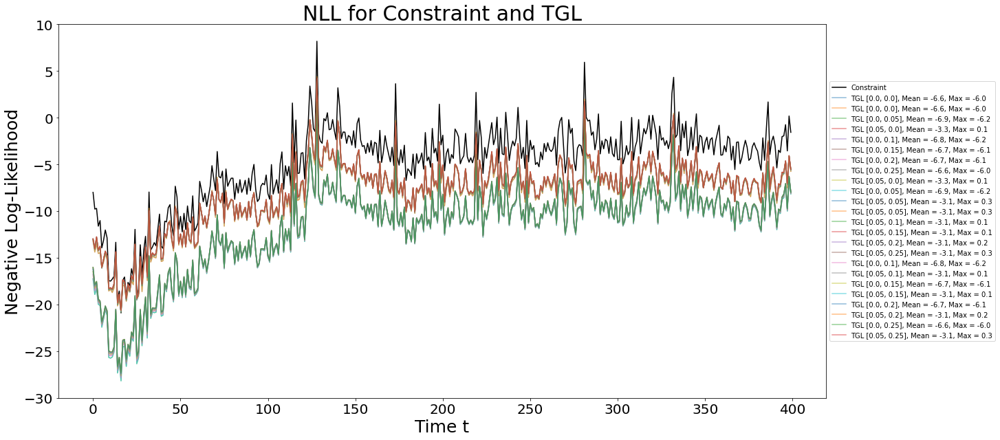

In [13]:
fig, ax = plt.subplots(figsize=(25, 10))
fig.patch.set_facecolor('white')
colors = "rgb"
color_index = 0
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.tab20.colors)

ax.plot(range(X_cov.shape[-1]), baseline_score_g, alpha=1, color='k', label=r'Constraint')

for i in np.arange(0, .3, 0.05):
    for j in np.arange(0, .3, 0.05):
        mean_diff = np.mean(np.array(tgl_score[i, j]) - baseline_score_g)
        max_diff = np.max(np.array(tgl_score[i, j]) - baseline_score_g)
        if (mean_diff < 0.5) and (max_diff < 0.5):
            ax.plot(range(X_cov.shape[-1]), tgl_score[i, j], alpha=0.5, label=r'TGL [{}, {}], Mean = {:.1f}, Max = {:.1f}'.format(str(round(i, 2)), str(round(j, 2)), mean_diff, max_diff))
        mean_diff = np.mean(np.array(tgl_score[j, i]) - baseline_score_g)
        max_diff = np.max(np.array(tgl_score[j, i]) - baseline_score_g)
        if (mean_diff < 0.5) and (max_diff < 0.5):
            ax.plot(range(X_cov.shape[-1]), tgl_score[j, i], alpha=0.5, label=r'TGL [{}, {}], Mean = {:.1f}, Max = {:.1f}'.format(str(round(j, 2)), str(round(i, 2)), mean_diff, max_diff))
    
#             label=r'Lin, Mean Diff = {:.3f}, Max Diff = {:.3f}'.format(mean_diff, max_diff))
# mean_diff = np.mean(np.array(fit_score_) - baseline_score_g)
# ax.plot(range(X_cov.shape[-1]), fit_score_, color='y', label=r'Vanilla TGL, Mean Diff = {:.3f}'.format(mean_diff))

box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))


# fig.legend(fontsize=20, loc='lower right', bbox_to_anchor=(0.495, 0.08, 0.5, 0.5))
ax.set_ylabel('Negative Log-Likelihood', fontsize=25)
ax.tick_params(axis='both', which='major', labelsize=20)
ax.set_xlabel('Time t', fontsize=25)
ax.set_ylim(-30, 10)
ax.set_title(r'NLL for Constraint and TGL', fontsize=30)
plt.savefig('ff5_ip30_20000_tgl_diff_like.pdf')

In [14]:
# pre_g = np.load("grad_sol_ff5_ip30_10000_rho_1e2_mult_1.1_m_50_eps_2_lap.npy")
pre_g = np.load("/Users/sky/Downloads/Booth/results/grad_long_ff5_ip30_20000_rho_1e2_mult_1.1_None_m_50_eps_2.npy")

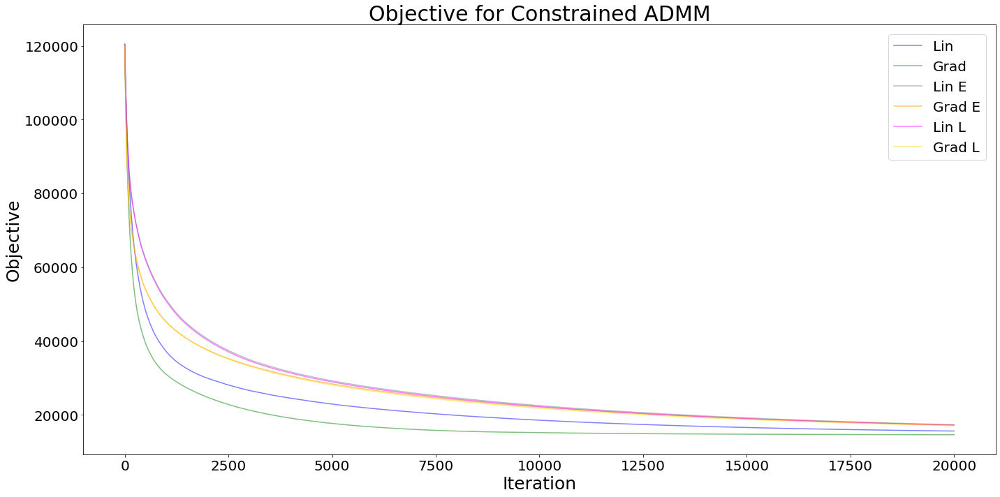

In [17]:
tgl_g_obj = np.load("/Users/sky/Downloads/Booth/results/obj_grad_long_ff5_ip30_20000_rho_1e2_mult_1.1_None_m_50_eps_2.npy")
tgl_tpe_obj = np.load("/Users/sky/Downloads/Booth/results/obj_lin_long_ff5_ip30_20000_rho_1e2_mult_1.1_None_m_50_eps_2.npy")

tgl_g_obj_e = np.load("/Users/sky/Downloads/Booth/results/obj_grad_long_ff5_ip30_20000_rho_1e2_mult_1.1_exp_m_50_eps_2.npy")
tgl_tpe_obj_e = np.load("/Users/sky/Downloads/Booth/results/obj_lin_long_ff5_ip30_20000_rho_1e2_mult_1.1_exp_m_50_eps_2.npy")

tgl_g_obj_l = np.load("/Users/sky/Downloads/Booth/results/obj_grad_long_ff5_ip30_20000_rho_1e2_mult_1.1_lin_m_50_eps_2.npy")
tgl_tpe_obj_l = np.load("/Users/sky/Downloads/Booth/results/obj_lin_long_ff5_ip30_20000_rho_1e2_mult_1.1_lin_m_50_eps_2.npy")

fig, ax = plt.subplots(figsize=(20, 10))
fig.patch.set_facecolor('white')
colors = "rgb"
color_index = 0
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.tab20.colors)

ax.plot(range(len(tgl_tpe_obj)), tgl_tpe_obj, alpha=0.5, color='blue',
        label=r'Lin')
ax.plot(range(len(tgl_g_obj)), tgl_g_obj, alpha=0.5, color='green',
        label=r'Grad')

ax.plot(range(len(tgl_tpe_obj)), tgl_tpe_obj_e, alpha=0.5, color='slategrey',
        label=r'Lin E')
ax.plot(range(len(tgl_g_obj)), tgl_g_obj_e, alpha=0.5, color='darkorange',
        label=r'Grad E')

ax.plot(range(len(tgl_tpe_obj)), tgl_tpe_obj_l, alpha=0.5, color='magenta',
        label=r'Lin L')
ax.plot(range(len(tgl_g_obj)), tgl_g_obj_l, alpha=0.5, color='gold',
        label=r'Grad L')

fig.legend(fontsize=20, loc='upper right', bbox_to_anchor=(0.49, 0.44, 0.5, 0.5))
ax.set_ylabel('Objective', fontsize=25)
ax.tick_params(axis='both', which='major', labelsize=20)
ax.set_xlabel('Iteration', fontsize=25)
ax.set_title(r'Objective for Constrained ADMM', fontsize=30)
plt.tight_layout()
plt.savefig('ff5_20000_obj.pdf')

In [ ]:
tgl_g_obj = np.load("/Users/sky/Downloads/Booth/results/obj_grad_long_ff5_ip30_20000_rho_1e2_mult_1.1_None_m_50_eps_2.npy")
tgl_tpe_obj = np.load("/Users/sky/Downloads/Booth/results/obj_lin_long_ff5_ip30_20000_rho_1e2_mult_1.1_None_m_50_eps_2.npy")

tgl_g_obj_e = np.load("/Users/sky/Downloads/Booth/results/obj_grad_long_ff5_ip30_20000_rho_1e2_mult_1.1_exp_m_50_eps_2.npy")
tgl_tpe_obj_e = np.load("/Users/sky/Downloads/Booth/results/obj_lin_long_ff5_ip30_20000_rho_1e2_mult_1.1_exp_m_50_eps_2.npy")

tgl_g_obj_l = np.load("/Users/sky/Downloads/Booth/results/obj_grad_long_ff5_ip30_20000_rho_1e2_mult_1.1_lin_m_50_eps_2.npy")
tgl_tpe_obj_l = np.load("/Users/sky/Downloads/Booth/results/obj_lin_long_ff5_ip30_20000_rho_1e2_mult_1.1_lin_m_50_eps_2.npy")

fig, ax = plt.subplots(figsize=(20, 10))
fig.patch.set_facecolor('white')
colors = "rgb"
color_index = 0
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.tab20.colors)

ax.plot(range(len(tgl_tpe_obj)), tgl_tpe_obj, alpha=0.5, color='blue',
        label=r'Lin')
ax.plot(range(len(tgl_g_obj)), tgl_g_obj, alpha=0.5, color='green',
        label=r'Grad')

ax.plot(range(len(tgl_tpe_obj)), tgl_tpe_obj_e, alpha=0.5, color='slategrey',
        label=r'Lin E')
ax.plot(range(len(tgl_g_obj)), tgl_g_obj_e, alpha=0.5, color='darkorange',
        label=r'Grad E')

ax.plot(range(len(tgl_tpe_obj)), tgl_tpe_obj_l, alpha=0.5, color='magenta',
        label=r'Lin L')
ax.plot(range(len(tgl_g_obj)), tgl_g_obj_l, alpha=0.5, color='gold',
        label=r'Grad L')

fig.legend(fontsize=20, loc='upper right', bbox_to_anchor=(0.49, 0.44, 0.5, 0.5))
ax.set_ylabel('Objective', fontsize=25)
ax.tick_params(axis='both', which='major', labelsize=20)
ax.set_xlabel('Iteration', fontsize=25)
ax.set_title(r'Objective for Constrained ADMM', fontsize=30)
plt.tight_layout()
plt.savefig('ff5_20000_obj.pdf')

In [6]:
from regain.norm import l1_od_norm
from regain.validation import check_norm_prox
psi, prox_psi, psi_node_penalty = check_norm_prox(tgl_g.psi)

def penalty_objective(Z_0, Z_1, Z_2, psi, theta):
    """Penalty-only objective function for time-varying graphical LASSO."""
    return theta * sum(map(l1_od_norm, Z_0)) + (1 - theta) * sum(map(psi, Z_2 - Z_1))

pre_g = {}
pre_g[0.2] = np.load("/Users/sky/Downloads/Booth/results/0.2_grad_long_ff5_ip30_10000_rho_1e2_mult_1.1_None_m_50_eps_2.npy")
pre_g[0.5] = np.load("/Users/sky/Downloads/Booth/results/grad_long_ff5_ip30_20000_rho_1e2_mult_1.1_None_m_50_eps_2.npy")
pre_g[0.8] = np.load("/Users/sky/Downloads/Booth/results/0.8_grad_long_ff5_ip30_10000_rho_1e2_mult_1.1_None_m_50_eps_2.npy")

pre_g_thres = {}
fit_score_g_thres = {}
for i in [0.2, 0.5, 0.8]:
    pre_g_thres[i] = np.array([k * (np.abs(k) >= 1e-4) for k in pre_g[i]])
    tgl_g.precision_ = pre_g_thres[i]
    emp_inv_score, baseline_score, fit_score_g_thres[i], _ = tgl_g.eval_cov_pre() 
    print(penalty_objective(pre_g_thres[i], pre_g_thres[i][:-1], pre_g_thres[i][1:], psi, tgl_g.theta))

43437.867144196316
14620.200294799482
20486.010176359454


In [12]:
from regain.norm import l1_od_norm
from regain.validation import check_norm_prox
psi, prox_psi, psi_node_penalty = check_norm_prox(tgl_g.psi)

def penalty_objective(Z_0, Z_1, Z_2, psi, theta):
    """Penalty-only objective function for time-varying graphical LASSO."""
    return theta * sum(map(l1_od_norm, Z_0)) + (1 - theta) * sum(map(psi, Z_2 - Z_1))

pre_tpe = {}
pre_tpe[0.2] = np.load("/Users/sky/Downloads/Booth/results/0.2_lin_long_ff5_ip30_20000_rho_1e2_mult_1.1_None_m_50_eps_2.npy")
pre_tpe[0.5] = np.load("/Users/sky/Downloads/Booth/results/lin_long_ff5_ip30_20000_rho_1e2_mult_1.1_None_m_50_eps_2.npy")
pre_tpe[0.8] = np.load("/Users/sky/Downloads/Booth/results/0.8_lin_long_ff5_ip30_20000_rho_1e2_mult_1.1_None_m_50_eps_2.npy")

pre_tpe_thres = {}
fit_score_tpe_thres = {}
for i in [0.2, 0.5, 0.8]:
    pre_tpe_thres[i] = np.array([k * (np.abs(k) >= 1e-4) for k in pre_tpe[i]])
    tgl_g.precision_ = pre_tpe_thres[i]
    emp_inv_score, baseline_score, fit_score_tpe_thres[i], _ = tgl_g.eval_cov_pre() 
    print(penalty_objective(pre_tpe_thres[i], pre_tpe_thres[i][:-1], pre_tpe_thres[i][1:], psi, tgl_g.theta))

34260.8487212436
15626.770510450986
24644.69311368701


In [18]:
# pre_tpe = np.load("equal_sol_ff5_ip30_10000_rho_1e2_mult_1.1_m_50_eps_2_lap.npy")
# pre_tpe = np.load("/Users/sky/Downloads/post_sum_merc/regain/lin_long_ff5_ip30_10000_rho_1e2_mult_1.1_None_m_50_eps_2.npy")
pre_tpe = np.load("/Users/sky/Downloads/Booth/results/lin_long_ff5_ip30_20000_rho_1e2_mult_1.1_None_m_50_eps_2.npy")

In [19]:
from regain.norm import l1_od_norm
from regain.validation import check_norm_prox
psi, prox_psi, psi_node_penalty = check_norm_prox(tgl_g.psi)

def penalty_objective(Z_0, Z_1, Z_2, psi, theta):
    """Penalty-only objective function for time-varying graphical LASSO."""
    return theta * sum(map(l1_od_norm, Z_0)) + (1 - theta) * sum(map(psi, Z_2 - Z_1))

pre_tpe_thres = {}
fit_score_tpe_thres = {}
for i in [1e-4, 1e-6, 0]:
    pre_tpe_thres[i] = np.array([k * (np.abs(k) >= i) for k in pre_tpe])
    tgl_g.precision_ = pre_tpe_thres[i]
    emp_inv_score, baseline_score, fit_score_tpe_thres[i], _ = tgl_g.eval_cov_pre() 
    print(penalty_objective(pre_tpe_thres[i], pre_tpe_thres[i][:-1], pre_tpe_thres[i][1:], psi, tgl_g.theta))

15626.770510450986
15626.777930117734
15626.77793836977


In [20]:
from regain.covariance import CVXInequalityTimeGraphicalLasso, TimeGraphicalLasso
pre_cvx = np.load("mosek_sol_ff5_30_standard_alpha_0.2.npy")

FileNotFoundError: [Errno 2] No such file or directory: 'mosek_sol_ff5_30_standard_alpha_0.2.npy'

In [22]:
tgl = TimeGraphicalLasso(alpha=1., beta=1., mode='admm', rho=1, tol=1e-4,
            rtol=1e-4, psi='laplacian', max_iter=20000, verbose=False, assume_centered=False, 
            return_history=False, update_rho_options=None, compute_objective=True, 
            stop_at=None, stop_when=1e-4, suppress_warn_list=False, init='empirical')
fit_score_, pre_ = tgl.fit_cov(X_cov).eval_cov_pre()   

179 1069.3230698758016


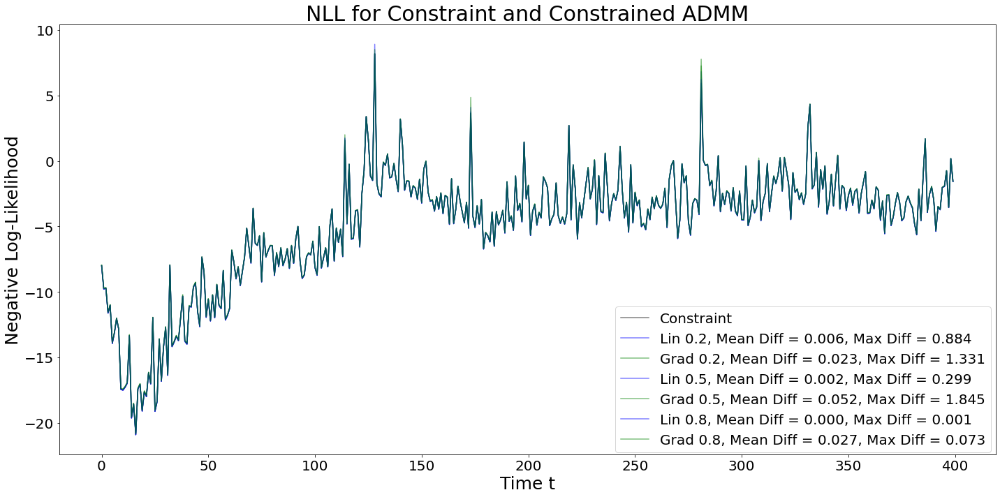

In [13]:
fig, ax = plt.subplots(figsize=(20, 10))
fig.patch.set_facecolor('white')
colors = "rgb"
color_index = 0
plt.rcParams["axes.prop_cycle"] = plt.cycler("color", plt.cm.tab20.colors)

# ax.plot(range(X_cov.shape[-1]), emp_inv_score_g, color='y', label=r'Empirical Inverse')
ax.plot(range(X_cov.shape[-1]), baseline_score_g, alpha=0.5, color='k', label=r'Constraint')
# for i in [1e-4]:
#     mean_diff = np.mean(np.array(fit_score[i]) - baseline_score)
#     ax.plot(range(X_cov.shape[-1]), fit_score[i], color='r', alpha=0.5, 
# #     ax.plot(range(X_cov.shape[-1]), fit_score[i], color=colors[color_index], alpha=0.5, 
#             label=r'Constrained MOSEK, Thres = {}, Mean Diff = {:.3f}'.format(i, mean_diff))
#     color_index += 1
# mean_diff = np.mean(np.array(fit_score_tp_thres[1e-4]) - baseline_score_g)
# # ax.plot(range(X_cov.shape[-1]), fit_score_tp, alpha=0.5, color='g',
# ax.plot(range(X_cov.shape[-1]), fit_score_tp_thres[1e-4], alpha=0.5, color='m',
#         label=r'Constrained ADMM Full, Mean Diff = {:.3f}'.format(mean_diff))
for i in [0.2, 0.5, 0.8]:
    mean_diff = np.mean(np.array(fit_score_tpe_thres[i]) - baseline_score_g)
    max_diff = np.max(np.array(fit_score_tpe_thres[i]) - baseline_score_g)
    # ax.plot(range(X_cov.shape[-1]), fit_score_tp, alpha=0.5, color='g',
    ax.plot(range(X_cov.shape[-1]), fit_score_tpe_thres[i], alpha=0.5, color='b',
            label=r'Lin {:.1f}, Mean Diff = {:.3f}, Max Diff = {:.3f}'.format(i, mean_diff, max_diff))
    mean_diff = np.mean(np.array(fit_score_g_thres[i]) - baseline_score_g)
    max_diff = np.max(np.array(fit_score_g_thres[i]) - baseline_score_g)
    # ax.plot(range(X_cov.shape[-1]), fit_score_tp, alpha=0.5, color='g',
    ax.plot(range(X_cov.shape[-1]), fit_score_g_thres[i], alpha=0.5, color='g',
            label=r'Grad {:.1f}, Mean Diff = {:.3f}, Max Diff = {:.3f}'.format(i, mean_diff, max_diff))
    # mean_diff = np.mean(np.array(fit_score_) - baseline_score_g)
    # ax.plot(range(X_cov.shape[-1]), fit_score_, color='y', label=r'Vanilla TGL, Mean Diff = {:.3f}'.format(mean_diff))

# mean_diff = np.mean(np.array(fit_score_tpe_thres[1e-4]) - baseline_score_g)
# max_diff = np.max(np.array(fit_score_tpe_thres[1e-4]) - baseline_score_g)
# # ax.plot(range(X_cov.shape[-1]), fit_score_tp, alpha=0.5, color='g',
# ax.plot(range(X_cov.shape[-1]), fit_score_tpe_thres[1e-4], alpha=0.5, color='b',
#         label=r'Lin, Mean Diff = {:.3f}, Max Diff = {:.3f}'.format(mean_diff, max_diff))
# mean_diff = np.mean(np.array(fit_score_g_thres[1e-4]) - baseline_score_g)
# max_diff = np.max(np.array(fit_score_g_thres[1e-4]) - baseline_score_g)
# # ax.plot(range(X_cov.shape[-1]), fit_score_tp, alpha=0.5, color='g',
# ax.plot(range(X_cov.shape[-1]), fit_score_g_thres[1e-4], alpha=0.5, color='g',
#         label=r'Grad, Mean Diff = {:.3f}, Max Diff = {:.3f}'.format(mean_diff, max_diff))
# # mean_diff = np.mean(np.array(fit_score_) - baseline_score_g)
# # ax.plot(range(X_cov.shape[-1]), fit_score_, color='y', label=r'Vanilla TGL, Mean Diff = {:.3f}'.format(mean_diff))
        
# mean_diff = np.mean(np.array(tgl_score[0.05, 0]) - baseline_score_g)
# max_diff = np.max(np.array(tgl_score[0.05, 0]) - baseline_score_g)
# ax.plot(range(X_cov.shape[-1]), tgl_score[0.05, 0], color = 'r', alpha=0.5, label=r'TGL [0.05, 0], Mean = {:.1f}, Max = {:.2f}'.format(mean_diff, max_diff))

# mean_diff = np.mean(np.array(tgl_score[0.05, 0.05]) - baseline_score_g)
# max_diff = np.max(np.array(tgl_score[0.05, 0.05]) - baseline_score_g)
# ax.plot(range(X_cov.shape[-1]), tgl_score[0.05, 0.05], color = 'm', alpha=0.5, label=r'TGL [0.05, 0.05], Mean = {:.1f}, Max = {:.2f}'.format(mean_diff, max_diff))

# mean_diff = np.mean(np.array(tgl_score[0.05, 0.1]) - baseline_score_g)
# max_diff = np.max(np.array(tgl_score[0.05, 0.1]) - baseline_score_g)
# ax.plot(range(X_cov.shape[-1]), tgl_score[0.05, 0.1], color = 'darkorange', alpha=0.5, label=r'TGL [0.05, 0.1], Mean = {:.1f}, Max = {:.1f}'.format(mean_diff, max_diff))


fig.legend(fontsize=20, loc='lower right', bbox_to_anchor=(0.495, 0.08, 0.5, 0.5))
ax.set_ylabel('Negative Log-Likelihood', fontsize=25)
ax.tick_params(axis='both', which='major', labelsize=20)
ax.set_xlabel('Time t', fontsize=25)
ax.set_title(r'NLL for Constraint and Constrained ADMM', fontsize=30)
plt.tight_layout()
plt.savefig('ff5_ip30_20000_long_None_diff_like_indiv.pdf')

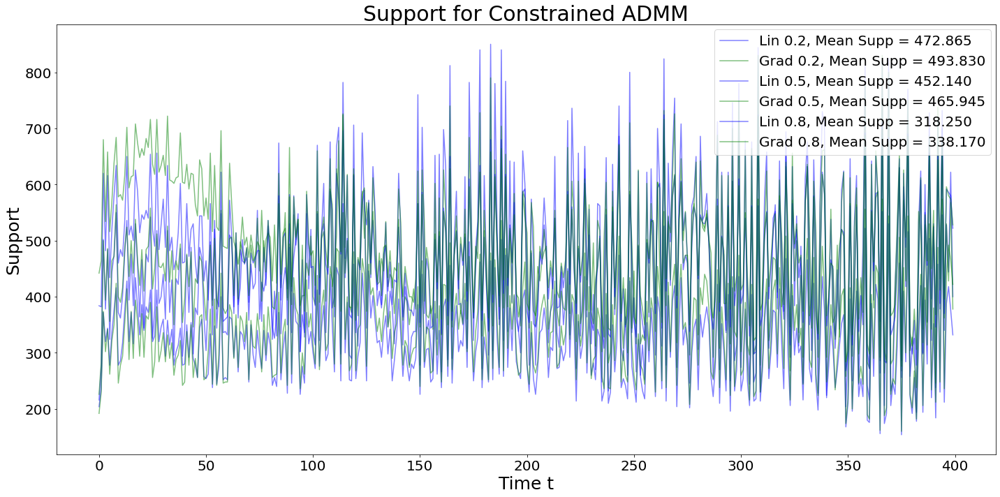

In [14]:
fig, ax = plt.subplots(figsize=(20, 10))
fig.patch.set_facecolor('white')
colors = "rgb"
color_index = 0

# ax.plot(range(X_cov.shape[-1]), [sum(sum(abs(emp_inv[k]) > 0)) for k in range(X_cov.shape[-1])], 
#         alpha=0.5, color='k', label=r'Empirical Inverse')
# for i in [min_pre_tp]:
# for i in [1e-4]:
#     supp = [sum(sum(abs(pre[i][t]) > 0)) for t in range(X_cov.shape[-1])]
#     mean_supp = np.mean(supp)
#     ax.plot(range(X_cov.shape[-1]), supp, color='r', alpha=0.5, 
# #     ax.plot(range(X_cov.shape[-1]), supp, color=colors[color_index], alpha=0.5, 
#             label=r'Constrained MOSEK, Thres = {}, Mean Supp = {}'.format(i, mean_supp))
#     color_index += 1
# supp = [sum(sum(abs(pre_grad[t]) > 0)) for t in range(X_cov.shape[-1])]
# ax.plot(range(X_cov.shape[-1]), supp, color='m', alpha=0.5,
#         label=r'Constraint TGL ADMM Gradient, Mean Supp = {:.3f}'.format(np.mean(supp)))
# supp = [sum(sum(abs(pre_tp_thres[1e-4][t]) > 0)) for t in range(X_cov.shape[-1])]
# # supp = [sum(sum(abs(pre_tp[t]) > 0)) for t in range(X_cov.shape[-1])]
# ax.plot(range(X_cov.shape[-1]), supp, color='m', alpha=0.5,
#         label=r'Constrained ADMM Full, Mean Supp = {:.3f}'.format(np.mean(supp)))

for i in [0.2, 0.5, 0.8]:
    supp = [sum(sum(abs(pre_tpe_thres[i][t]) > 0)) for t in range(X_cov.shape[-1])]
    # supp = [sum(sum(abs(pre_tp[t]) > 0)) for t in range(X_cov.shape[-1])]
    ax.plot(range(X_cov.shape[-1]), supp, color='b', alpha=0.5,
            label=r'Lin {:.1f}, Mean Supp = {:.3f}'.format(i, np.mean(supp)))
    supp = [sum(sum(abs(pre_g_thres[i][t]) > 0)) for t in range(X_cov.shape[-1])]
    # supp = [sum(sum(abs(pre_tp[t]) > 0)) for t in range(X_cov.shape[-1])]
    ax.plot(range(X_cov.shape[-1]), supp, color='g', alpha=0.5,
            label=r'Grad {:.1f}, Mean Supp = {:.3f}'.format(i, np.mean(supp)))
    # supp = [sum(sum(abs(pre_[t]) > 0)) for t in range(X_cov.shape[-1])]
    # ax.plot(range(X_cov.shape[-1]), [sum(sum(abs(pre_[k]) > 0)) for k in range(X_cov.shape[-1])], 
    #         color='y', label=r'Vanilla TGL, , Mean Supp = {:.3f}'.format(np.mean(supp)))



# supp = [sum(sum(abs(pre_tpe_thres[1e-4][t]) > 0)) for t in range(X_cov.shape[-1])]
# # supp = [sum(sum(abs(pre_tp[t]) > 0)) for t in range(X_cov.shape[-1])]
# ax.plot(range(X_cov.shape[-1]), supp, color='b', alpha=0.5,
#         label=r'Lin, Mean Supp = {:.3f}'.format(np.mean(supp)))
# supp = [sum(sum(abs(pre_g_thres[1e-4][t]) > 0)) for t in range(X_cov.shape[-1])]
# # supp = [sum(sum(abs(pre_tp[t]) > 0)) for t in range(X_cov.shape[-1])]
# ax.plot(range(X_cov.shape[-1]), supp, color='g', alpha=0.5,
#         label=r'Grad, Mean Supp = {:.3f}'.format(np.mean(supp)))
# # supp = [sum(sum(abs(pre_[t]) > 0)) for t in range(X_cov.shape[-1])]
# # ax.plot(range(X_cov.shape[-1]), [sum(sum(abs(pre_[k]) > 0)) for k in range(X_cov.shape[-1])], 
# #         color='y', label=r'Vanilla TGL, , Mean Supp = {:.3f}'.format(np.mean(supp)))


# supp = [sum(sum(abs(tgl_pre[0.05, 0][t]) > 0)) for t in range(X_cov.shape[-1])]
# ax.plot(range(X_cov.shape[-1]), supp, color='r', alpha=0.5, label=r'TGL [{:.2f}, {:.2f}], Mean Supp = {:.1f}'.format(0.05, 0, np.mean(supp)))
# # supp = [sum(sum(abs(tgl_pre[0.05, 0.05][t]) > 0)) for t in range(X_cov.shape[-1])]
# # ax.plot(range(X_cov.shape[-1]), supp, color='m', alpha=0.5, label=r'TGL [{:.2f}, {:.2f}], Mean Supp = {:.1f}'.format(0.05, 0.05, np.mean(supp)))
# supp = [sum(sum(abs(tgl_pre[0.05, 0.1][t]) > 0)) for t in range(X_cov.shape[-1])]
# ax.plot(range(X_cov.shape[-1]), supp, color='darkorange', alpha=0.5, label=r'TGL [{:.2f}, {:.2f}], Mean Supp = {:.1f}'.format(0.05, 0.1, np.mean(supp)))


fig.legend(fontsize=20, loc='upper right', bbox_to_anchor=(0.495, 0.45, 0.5, 0.5))
ax.set_ylabel('Support', fontsize=25)
ax.tick_params(axis='both', which='major', labelsize=20)
ax.set_xlabel('Time t', fontsize=25)
ax.set_title(r'Support for Constrained ADMM', fontsize=30)
plt.tight_layout()
plt.savefig('ff5_ip30_20000_long_None_diff_supp_indiv.pdf')

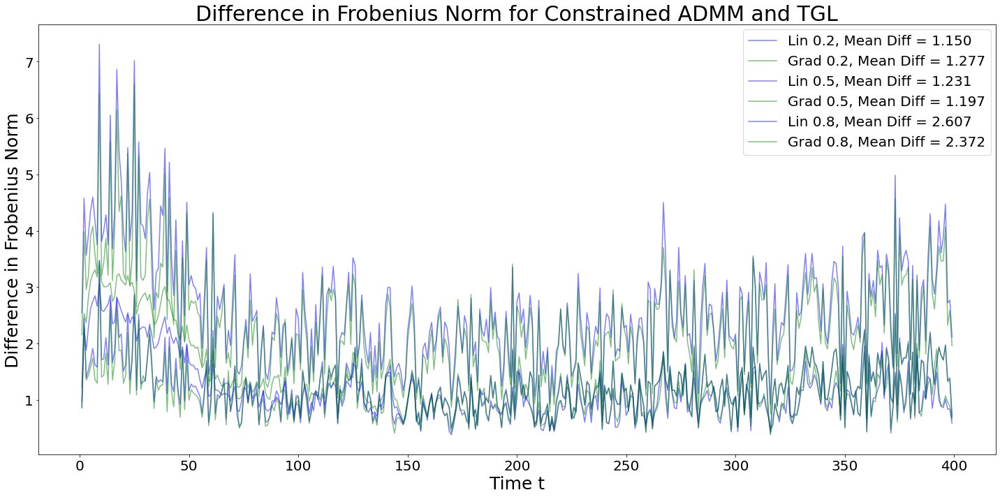

In [15]:
fig, ax = plt.subplots(figsize=(20, 10))
fig.patch.set_facecolor('white')
colors = "rgb"
color_index = 0

# diff_emp = [norm(emp_inv[t] - emp_inv[t-1], 'fro') for t in range(1, X_cov.shape[-1])]
# ax.plot(range(1, X_cov.shape[-1]), np.array(diff_emp), alpha=1, color='k', label=r'Empirical Inverse')
# for i in [min_pre_tp]:
# for i in [1e-4]:
#     diff = [norm(pre[i][t] - pre[i][t-1], 'fro') for t in range(1, X_cov.shape[-1])]
#     mean_diff = np.mean(diff)
#     ax.plot(range(1, X_cov.shape[-1]), diff, color='r', alpha=0.5, 
# #     ax.plot(range(1, X_cov.shape[-1]), diff, color=colors[color_index], alpha=0.5, 
#             label=r'Constrained MOSEK, Thres = {}, Mean Diff = {:.3f}'.format(i, mean_diff))
#     color_index += 1
# diff_grad = [norm(pre_grad[t] - pre_grad[t-1], 'fro') for t in range(1, X_cov.shape[-1])]
# ax.plot(range(1, X_cov.shape[-1]), diff_grad, color='m', alpha=0.5,
#         label=r'Constraint TGL ADMM Gradient, Mean Diff = {:.3f}'.format(np.mean(diff_grad)))

for i in [0.2, 0.5, 0.8]:
    diff_grad = [norm(pre_tpe_thres[i][t] - pre_tpe_thres[i][t-1], 'fro') for t in range(1, X_cov.shape[-1])]
    # diff_grad = [norm(pre_tp[t] - pre_tp[t-1], 'fro') for t in range(1, X_cov.shape[-1])]
    ax.plot(range(1, X_cov.shape[-1]), diff_grad, color='b', alpha=0.5,
            label=r'Lin {:.1f}, Mean Diff = {:.3f}'.format(i, np.mean(diff_grad)))
    diff_grad = [norm(pre_g_thres[i][t] - pre_g_thres[i][t-1], 'fro') for t in range(1, X_cov.shape[-1])]
    # diff_grad = [norm(pre_tp[t] - pre_tp[t-1], 'fro') for t in range(1, X_cov.shape[-1])]
    ax.plot(range(1, X_cov.shape[-1]), diff_grad, color='g', alpha=0.5,
            label=r'Grad {:.1f}, Mean Diff = {:.3f}'.format(i, np.mean(diff_grad)))
    # diff_grad = [norm(pre_tp_thres[1e-4][t] - pre_tp_thres[1e-4][t-1], 'fro') for t in range(1, X_cov.shape[-1])]
    # # diff_grad = [norm(pre_tp[t] - pre_tp[t-1], 'fro') for t in range(1, X_cov.shape[-1])]
    # ax.plot(range(1, X_cov.shape[-1]), diff_grad, color='m', alpha=0.5,
    #         label=r'Constraint ADMM Full, Mean Diff = {:.3f}'.format(np.mean(diff_grad)))
    # diff_fit_ = [norm(pre_[t] - pre_[t-1], 'fro') for t in range(1, X_cov.shape[-1])]
    # ax.plot(range(1, X_cov.shape[-1]), np.array(diff_fit_), color='y', alpha=0.5, 
    #         label=r'TGL, Mean Diff = {:.3f}'.format(np.mean(diff_fit_)))


# diff_grad = [norm(pre_tpe_thres[1e-4][t] - pre_tpe_thres[1e-4][t-1], 'fro') for t in range(1, X_cov.shape[-1])]
# # diff_grad = [norm(pre_tp[t] - pre_tp[t-1], 'fro') for t in range(1, X_cov.shape[-1])]
# ax.plot(range(1, X_cov.shape[-1]), diff_grad, color='b', alpha=0.5,
#         label=r'Lin, Mean Diff = {:.3f}'.format(np.mean(diff_grad)))
# diff_grad = [norm(pre_g_thres[1e-4][t] - pre_g_thres[1e-4][t-1], 'fro') for t in range(1, X_cov.shape[-1])]
# # diff_grad = [norm(pre_tp[t] - pre_tp[t-1], 'fro') for t in range(1, X_cov.shape[-1])]
# ax.plot(range(1, X_cov.shape[-1]), diff_grad, color='g', alpha=0.5,
#         label=r'Grad, Mean Diff = {:.3f}'.format(np.mean(diff_grad)))
# # diff_grad = [norm(pre_tp_thres[1e-4][t] - pre_tp_thres[1e-4][t-1], 'fro') for t in range(1, X_cov.shape[-1])]
# # # diff_grad = [norm(pre_tp[t] - pre_tp[t-1], 'fro') for t in range(1, X_cov.shape[-1])]
# # ax.plot(range(1, X_cov.shape[-1]), diff_grad, color='m', alpha=0.5,
# #         label=r'Constraint ADMM Full, Mean Diff = {:.3f}'.format(np.mean(diff_grad)))
# # diff_fit_ = [norm(pre_[t] - pre_[t-1], 'fro') for t in range(1, X_cov.shape[-1])]
# # ax.plot(range(1, X_cov.shape[-1]), np.array(diff_fit_), color='y', alpha=0.5, 
# #         label=r'TGL, Mean Diff = {:.3f}'.format(np.mean(diff_fit_)))

# diff_fit_ = [norm(tgl_pre[0.05, 0][t] - tgl_pre[0.1, 0][t-1], 'fro') for t in range(1, X_cov.shape[-1])]
# ax.plot(range(1, X_cov.shape[-1]), np.array(diff_fit_), color='r', alpha=0.5, 
#         label=r'TGL [0.05, 0], Mean Diff = {:.3f}'.format(np.mean(diff_fit_)))

# diff_fit_ = [norm(tgl_pre[0.05, 0.1][t] - tgl_pre[0.1, 0.1][t-1], 'fro') for t in range(1, X_cov.shape[-1])]
# ax.plot(range(1, X_cov.shape[-1]), np.array(diff_fit_), color='darkorange', alpha=0.5, 
#         label=r'TGL [0.05, 0.1], Mean Diff = {:.3f}'.format(np.mean(diff_fit_)))

fig.legend(fontsize=20, loc='upper right', bbox_to_anchor=(0.495, 0.45, 0.5, 0.5))
ax.set_ylabel('Difference in Frobenius Norm', fontsize=25)
ax.tick_params(axis='both', which='major', labelsize=20)
ax.set_xlabel('Time t', fontsize=25)
ax.set_title(r'Difference in Frobenius Norm for Constrained ADMM and TGL', fontsize=30)
plt.tight_layout()
plt.savefig('ff5_ip30_20000_long_None_diff_fro_indiv.pdf')

In [16]:
import networkx as nx
labels_ = ['Food','Beer','Smoke','Games','Books','Hshld','Clths','Hlth','Chems','Txtls','Cnstr','Steel','FabPr','ElcEq','Autos','Carry','Mines','Coal','Oil','Util','Telcm','Servs','BusEq','Paper','Trans','Whlsl','Rtail','Meals','Fin','Other']
labels = {}
for i in range(len(labels_)):
    labels[i] = labels_[i]

In [17]:
labels

{0: 'Food',
 1: 'Beer',
 2: 'Smoke',
 3: 'Games',
 4: 'Books',
 5: 'Hshld',
 6: 'Clths',
 7: 'Hlth',
 8: 'Chems',
 9: 'Txtls',
 10: 'Cnstr',
 11: 'Steel',
 12: 'FabPr',
 13: 'ElcEq',
 14: 'Autos',
 15: 'Carry',
 16: 'Mines',
 17: 'Coal',
 18: 'Oil',
 19: 'Util',
 20: 'Telcm',
 21: 'Servs',
 22: 'BusEq',
 23: 'Paper',
 24: 'Trans',
 25: 'Whlsl',
 26: 'Rtail',
 27: 'Meals',
 28: 'Fin',
 29: 'Other'}

In [18]:
def circular_layout(G, index, scale=0.1, center=None, dim=2):
    # dim=2 only
    """Position nodes on a circle.

    Parameters
    ----------
    G : NetworkX graph or list of nodes
        A position will be assigned to every node in G.

    scale : number (default: 1)
        Scale factor for positions.

    center : array-like or None
        Coordinate pair around which to center the layout.

    dim : int
        Dimension of layout.
        If dim>2, the remaining dimensions are set to zero
        in the returned positions.
        If dim<2, a ValueError is raised.

    Returns
    -------
    pos : dict
        A dictionary of positions keyed by node

    Raises
    -------
    ValueError
        If dim < 2

    Examples
    --------
    >>> G = nx.path_graph(4)
    >>> pos = nx.circular_layout(G)

    Notes
    -----
    This algorithm currently only works in two dimensions and does not
    try to minimize edge crossings.

    """
    import numpy as np

    if dim < 2:
        raise ValueError("cannot handle dimensions < 2")

    # Discard the extra angle since it matches 0 radians.
    theta = np.linspace(0, 1, len(G))[:-1] * 2 * np.pi
    theta = theta.astype(np.float32)
    pos = np.column_stack(
            [np.cos(theta), np.sin(theta)]
        )
    pos = nx.rescale_layout(pos, scale=scale)
    centre = [0, pos[0][1]]
#     pdb.set_trace()
#     pos = np.vstack((centre, pos))
    pos = np.insert(pos, index, centre, 0) 
    pos = dict(zip(G, pos))

    return pos

In [85]:
def degree(precisions, index, labels):
    import math
    import matplotlib.dates as mdates
    from scipy.interpolate import UnivariateSpline
    
    time_points, _, _ = precisions.shape
    
    degrees = []
    
    for i in range(time_points):
        degrees.append(sum(precisions[i][index] != 0))
    
    diff_deg = [degrees[t] - degrees[t-1] for t in range(1, len(degrees))]
    print(sum(abs(np.array(diff_deg))))
    print(time_points - 1)
    fig, ax = plt.subplots(figsize=(10, 8))
#     # smooth using yearly rolling averages
#     kernel_size = 12
#     ave = np.convolve(degrees, np.ones(kernel_size) / kernel_size, mode='same')
#     # fit with spline with k = 3
#     spline = UnivariateSpline(range(time_points)[12:(time_points - 12)], ave[12:(time_points - 12)], k=3)
    spline = UnivariateSpline(range(1, time_points), diff_deg, k=3)
#     # plot fitted spline 
    ax.plot(np.arange(np.datetime64('1965-02'), np.datetime64('1997-01')), spline(range(1, time_points)))
#     ax.plot(np.arange(np.datetime64('1965-01'), np.datetime64('1997-01')), ave)
    
    ax.set_ylabel('Degree')
    ax.set_xlabel('Year')
    ax.xaxis.set_major_locator(mdates.YearLocator(5))
    ax.xaxis.set_minor_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax.set_ylim([0, 30])
    plt.title('Degree over Year for {}'.format(labels[index].title()))
    plt.tight_layout()

    plt.savefig('plots/deg_{}.pdf'.format(labels[index].lower()))  

2628
383
1338
383
1360
383


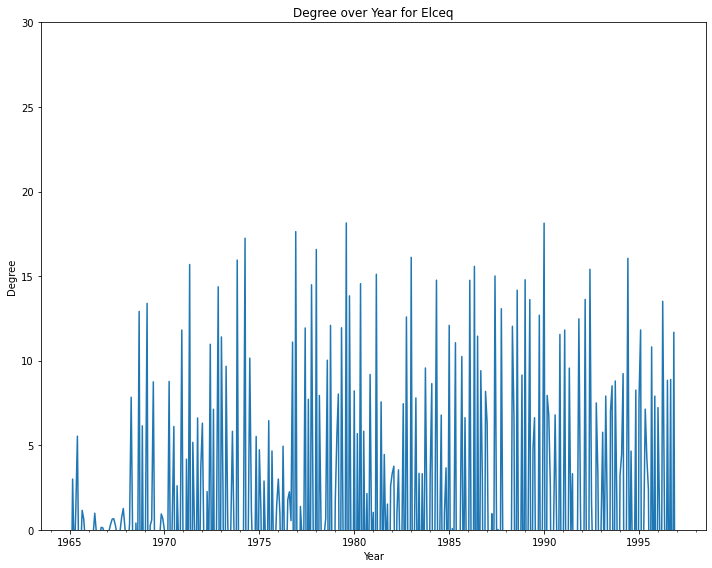

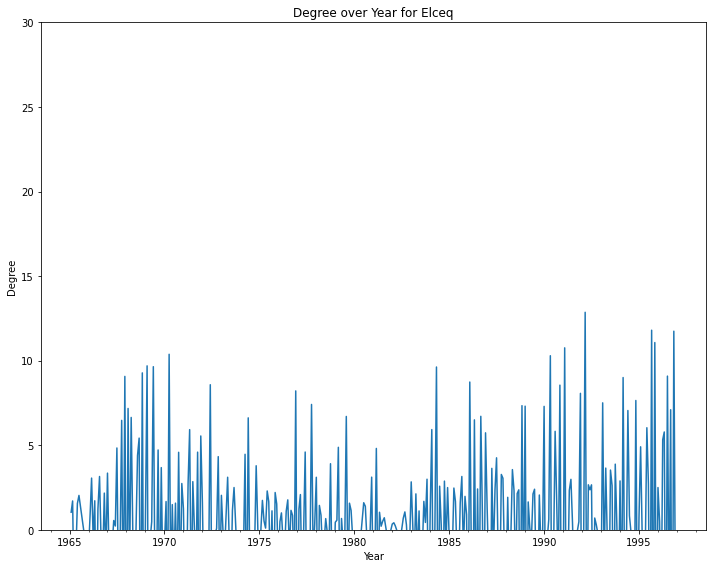

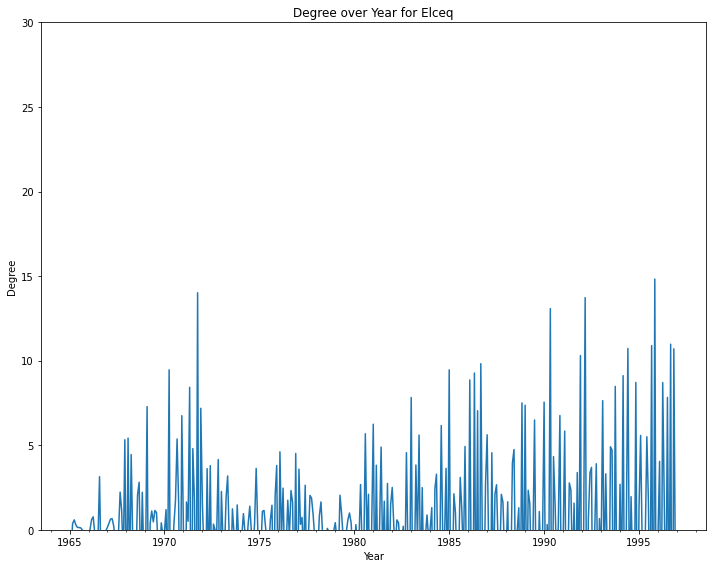

In [86]:
# for i in [10, 13, 17, 18, 21, 23, 28]:
for i in [13]:
#     yearly_probabilities(pre_tpe_thres[1e-4][8:392], 96, 0.5, i, labels)
#     yearly_diff_probabilities(pre_tpe_thres[1e-4][8:], 24, 0.1, i, labels)
    for j in [0.2, 0.5, 0.8]:
        degree(pre_tpe_thres[j][8:392], i, labels)

In [39]:
def yearly_probabilities(precisions, div, thres, index, labels):
    
    import math
    from matplotlib.gridspec import GridSpec
    
    time_points, _, _ = precisions.shape
    n_years = np.floor(time_points / div).astype(int)
    
    # conditional dependencies
    probs = {}
    # probability values
    vals = set()
    
    for i in range(n_years):
        for j in range(div):
            # accumulate indicators for conditional dependence
            try:
                probs[i] += (abs(precisions[(i * div) + j][index]) > 0).astype(int)
            except KeyError:
                probs[i] = (abs(precisions[(i * div) + j][index]) > 0).astype(int)
        # get conditional dependencies for ith plot
        probs[i] = (probs[i] / div) * (probs[i] / div > thres) 
        # get union of possible probabilities
        vals = vals | set(probs[i])          
            
    vals = vals - {0}
    
    # define figure
    nrow = math.ceil(len(probs.keys()) / 4)
    ncol = 4
        
    fig = plt.figure(figsize=(12 * ncol, 12 * nrow), 
                     constrained_layout=True)
    # set widths
    widths = np.ones(ncol+1)
    widths[-1] = 0.05
    # set grid
    gs = GridSpec(nrow, ncol+1, figure=fig, width_ratios=widths)

    cmap=plt.cm.get_cmap('viridis', len(vals))
    
    axes = []
    for i in range(nrow):
        for j in range(ncol):
            axes.append(fig.add_subplot(gs[i, j]))
            k = i * 4 + j
            # remove index of interest
            probs_i_ = np.array(np.delete(probs[k], index))
            # remove label of index of interest
            rows = np.delete(np.arange(len(labels)), index)
            cols = [index] * (len(rows))
            edges = [e for e in zip(cols, rows.tolist(), probs_i_)]
            edges = [e for e in edges if (e[2] > 0)]
            probs_i = np.array([p for p in probs_i_ if p > 0])
            gr = nx.Graph()
            gr.add_nodes_from(range(len(labels)))
            gr.add_weighted_edges_from(edges)
            pos = circular_layout(gr, index, 0.4)
            nx.draw_networkx_nodes(gr, pos, ax=axes[-1], node_size=4500)
            edges = nx.draw_networkx_edges(gr, pos, ax=axes[-1], width=10, edge_cmap=cmap, edge_color=probs_i)
            nx.draw_networkx_labels(gr, pos, ax=axes[-1], labels=labels, font_size=20, font_color='white')
            axes[-1].set_title('{} - {}'.format(1965 + 8 * k, 1965 + 8 * (k + 1) - 1), fontsize=30)
            
    axes.append(fig.add_subplot(gs[:, ncol]))
    cbar = fig.colorbar(edges, cax=axes[-1], ticks=np.arange(0.45, 1.05, 0.05))
    cbar.ax.tick_params(labelsize=30)
    fig.suptitle('Edge Probabilities for {}'.format(labels[index].title()), fontsize=60)
    
    plt.savefig('plots/yp_{}.pdf'.format(labels[index].lower()))

In [33]:
def yearly_diff_probabilities(precisions, div, thres, index, labels):
    import math
     
    time_points, _, _ = precisions.shape
    n_years = np.floor(time_points / div).astype(int)

    probs = {}
    
    for i in range(n_years):
        for j in range(div):
            try:
                probs[i] += (abs(precisions[(i * div) + j][index]) > 0).astype(int)
            except KeyError:
                probs[i] = (abs(precisions[(i * div) + j][index]) > 0).astype(int)
        probs[i] = probs[i] / div
        
    probs_diff = {}

#     probs_diff[0] = probs[0] * (probs[0] > thres)
#     print(probs_diff[0])
    
    for i in range(1, n_years):
        probs_diff[i] = (probs[i] - probs[i-1]) * (abs(probs[i] - probs[i-1]) > thres)     
    
    fig, axes = plt.subplots(nrows=4, ncols=math.ceil(len(probs.keys()) / 4), figsize=(12 * math.ceil(len(probs.keys()) / 2), 12 * 8))
#     fig, axes = plt.subplots(nrows=2, ncols=math.ceil(len(probs.keys()) / 4), figsize=(12 * math.ceil(len(probs.keys()) / 2), 12 * 8))
    fig.suptitle('Yearly Edge Probabilities for {}'.format(labels[index].title()), fontsize=100)
    
    for i in probs_diff.keys():
        probs_i_ = np.array(np.delete(probs_diff[i], index))
        rows = np.delete(np.arange(len(labels)), index)
        cols = [index] * (len(rows))
        edges = [e for e in zip(cols, rows.tolist(), probs_i_)]
        edges = [e for e in edges if (e[2] != 0)]
        probs_i = np.array([p for p in probs_i_ if p != 0])
        gr = nx.Graph()
        gr.add_nodes_from(range(len(labels)))
        gr.add_weighted_edges_from(edges)
        pos = circular_layout(gr, index)
        nx.draw_networkx_nodes(gr, pos, ax=axes.flat[i], node_size=10000)
        if i == 0:
            edges = nx.draw_networkx_edges(gr, pos, ax=axes.flat[i], width=10) 
        else:
            edges = nx.draw_networkx_edges(gr, pos, ax=axes.flat[i], width=10, edge_cmap=plt.cm.winter, edge_color=probs_i)
        nx.draw_networkx_labels(gr, pos, ax=axes.flat[i], labels=labels, font_size=40, font_color='white')

    plt.tight_layout()
    fig.subplots_adjust(top=0.95, right=0.95)
    cbar_ax = fig.add_axes([0.975, 0.05, 0.015, 0.9])
    cbar = fig.colorbar(edges, cax=cbar_ax)
    cbar.ax.tick_params(labelsize=30)
    
    plt.savefig('plots/ydp_{}.pdf'.format(labels[index].lower()))    

In [36]:
def yearly_probabilities(precisions, labels):
    import math

    time_points, _, _ = precisions.shape
    n_years = np.floor(time_points / 12).astype(int)

    probs = {}
    
    for i in range(n_years):
        for j in range(12):
            try:
                probs[i] += (abs(precisions[(i*12) + j]) > 0).astype(int)
            except KeyError:
                probs[i] = (abs(precisions[(i*12) + j]) > 0).astype(int)
        probs[i] = probs[i] / 12
        
    fig, axes = plt.subplots(nrows=2, ncols=int(len(probs.keys()) / 2), figsize=(12 * int(len(probs.keys()) / 2), 12 * 2 ))
    fig.suptitle('Yearly Edge Probabilities', fontsize=40)
    
    for i in probs.keys():
#         pdb.set_trace()
        gr = nx.from_numpy_matrix(probs[i])
#         gr.add_nodes_from(range(len(labels)))
#         gr.add_weighted_edges_from(probs[i])
        pos = nx.spring_layout(gr)
        nx.draw_networkx_nodes(gr, pos, ax=axes.flat[i], node_size=4000)
        edges = nx.draw_networkx_edges(gr, pos, ax=axes.flat[i])
        nx.draw_networkx_labels(gr, pos, ax=axes.flat[i], labels=labels, font_size=20, font_color='white')

#         nx.draw(gr, pos, ax=axes[i], node_size=1500, font_color='white', labels=labels, with_labels=True, cmap=cmap, node_color=prob)
    #     pdb.set_trace()
        axis = plt.gca()
#         fig.subplots_adjust(right=0.8)
#         cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
    plt.tight_layout()
    fig.subplots_adjust(top=0.95, right=0.95)
    cbar_ax = fig.add_axes([0.975, 0.05, 0.015, 0.9])
    cbar = fig.colorbar(edges, cax=cbar_ax)
    cbar.ax.tick_params(labelsize=30)
    
#     plt.axis("off")
    plt.show()

IndexError: index 32 is out of bounds for axis 0 with size 32

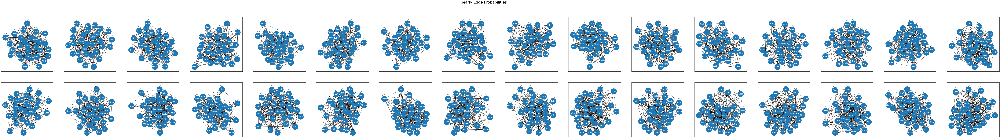

In [37]:
yearly_probabilities(pre_tpe_thres[1e-4], labels)

In [ ]:
total_diff = abs(prob_diff[1])

for i in range(2, n_years):
    total_diff += abs(prob_diff[i])

In [ ]:
change = []
for i in range(len(labels_)):
    if total_diff[i] == 0:
        change.append(labels_[i])
        
print(change)

In [ ]:
factor = {}

for i in range(n_years):
    g = (prob[i] > 0.8)
    factor[i] = []
    for j in range(len(labels_)):
        if g[j] == 1:
            factor[i].append(labels_[j])
            
print(factor)

for i in range(1, n_years):
    curr = set(factor[i])
    prev = set(factor[i-1])
    print(curr.intersection(prev))

In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))
G = nx.from_numpy_matrix(np.array(pre_tpe_thres[1e-4][50])) 
partition = nx.algorithms.community.greedy_modularity_communities(G)
print(list(partition))
# G = nx.relabel_nodes(G, labels)
cmap = cm.get_cmap('viridis', length(partition) + 1)
nx.draw_circular(G, node_size=1500, font_color='white', labels=labels, with_labels=True, cmap=cmap, node_color=list(partition.values())) 

# nx.draw_spring(G, node_size=1500, font_color='white', labels=labels, with_labels=True) 
# print(list(nx.enumerate_all_cliques(G)))

In [ ]:
import community as community_louvain
import matplotlib.cm as cm
import matplotlib.pyplot as plt
G = nx.from_numpy_matrix(np.array(pre_tpe_thres[1e-4][51])) 
# partition = community_louvain.best_partition(G)
partition = nx.algorithms.community.greedy_modularity_communities(G)
print(partition)
# pos = nx.spring_layout(G)
# color the nodes according to their partition
fig, ax = plt.subplots(figsize=(20, 20))
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_circular(G, node_size=1500, font_color='white', labels=labels, with_labels=True, cmap=cmap, node_color=list(partition.values())) 
plt.show()

In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))
G = nx.from_numpy_matrix(np.array(pre_tpe_thres[1e-4][51])) 
# G = nx.relabel_nodes(G, labels)
nx.draw_circular(G, node_size=1500, font_color='white', labels=labels, with_labels=True) 

In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))
G = nx.from_numpy_matrix(np.array(pre_tpe_thres[1e-4][52])) 
# G = nx.relabel_nodes(G, labels)
nx.draw_circular(G, node_size=1500, font_color='white', labels=labels, with_labels=True) 

In [ ]:
fig, ax = plt.subplots(figsize=(20, 20))
G = nx.from_numpy_matrix(np.array(pre_tpe_thres[1e-4][53])) 
# G = nx.relabel_nodes(G, labels)
nx.draw_circular(G, node_size=1500, font_color='white', labels=labels, with_labels=True) 

In [ ]:
show_graph_with_labels(abs(pre_tpe_thres[1e-4][50][0]) > 0, pos, 0, labels)

In [ ]:
show_graph_with_labels(abs(pre_tpe_thres[1e-4][51][0]) > 0, pos, 0, labels)

In [ ]:
show_graph_with_labels(abs(pre_tpe_thres[1e-4][52][0]) > 0, pos, 0, labels)

In [ ]:
show_graph_with_labels(abs(pre_tpe_thres[1e-4][53][0]) > 0, pos, 0, labels)